<a href="https://colab.research.google.com/github/NuchPunnawichP/KAIST_Intern/blob/main/DoE_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

import pandas as pd
import requests

In [2]:
excel_url = "https://github.com/NuchPunnawichP/KAIST_Intern/raw/main/DoE/DoE_Datas.xlsx"
response = requests.get(excel_url)

response.raise_for_status()

with open("temp_excel_file.xlsx", "wb") as f:
    f.write(response.content)

pre_data = pd.read_excel("temp_excel_file.xlsx")

display(pre_data)

,Features,R1,R2,R3,R4,R5,R6,R7,R8,R9,...,R654,R655,R656,R657,R658,R659,R660,R661,R662,R663
0,Base_lenght,4.000,5.000,6.000,7.000,8.000,5.000,6.000,7.000,8.000,...,6.000,7.000,8.000,2.000,3.000,4.000,5.000,6.000,7.000,8.000
1,Base_angle,60.000,60.000,60.000,60.000,60.000,55.000,55.000,55.000,55.000,...,75.000,75.000,75.000,80.000,80.000,80.000,80.000,80.000,80.000,80.000
2,Contact_lenght,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,...,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000
3,Point_x,3.800,3.800,3.800,3.800,3.800,3.800,3.800,3.800,3.800,...,4.200,4.200,4.200,4.200,4.200,4.200,4.200,4.200,4.200,4.200
4,Point_y,3.200,3.200,3.200,3.200,3.200,3.200,3.200,3.200,3.200,...,3.400,3.400,3.400,3.400,3.400,3.400,3.400,3.400,3.400,3.400
5,0,36.065,34.672,31.540,27.588,23.817,34.118,29.923,27.018,23.302,...,32.457,28.176,24.994,40.435,40.640,38.561,35.586,32.547,28.221,24.962
6,2500,36.560,34.894,31.649,27.658,23.860,34.411,30.072,27.098,23.349,...,32.552,28.249,25.045,41.296,41.045,38.804,35.728,32.632,28.283,25.006
7,5000,37.100,35.127,31.762,27.732,23.905,34.724,30.229,27.182,23.398,...,32.650,28.323,25.098,42.247,41.474,39.057,35.874,32.720,28.346,25.050
8,7500,37.715,35.386,31.891,27.813,23.954,35.078,30.408,27.277,23.452,...,32.751,28.400,25.152,43.307,41.928,39.320,36.025,32.811,28.412,25.096
9,10000,38.420,35.680,32.035,27.901,24.007,35.478,30.609,27.383,23.511,...,32.859,28.480,25.208,44.502,42.412,39.596,36.184,32.907,28.480,25.143


#For finding liearity with R2_score

In [3]:
data = pre_data.iloc[5:18]
display(data)

,Features,R1,R2,R3,R4,R5,R6,R7,R8,R9,...,R654,R655,R656,R657,R658,R659,R660,R661,R662,R663
5,0,36.065,34.672,31.540,27.588,23.817,34.118,29.923,27.018,23.302,...,32.457,28.176,24.994,40.435,40.640,38.561,35.586,32.547,28.221,24.962
6,2500,36.560,34.894,31.649,27.658,23.860,34.411,30.072,27.098,23.349,...,32.552,28.249,25.045,41.296,41.045,38.804,35.728,32.632,28.283,25.006
7,5000,37.100,35.127,31.762,27.732,23.905,34.724,30.229,27.182,23.398,...,32.650,28.323,25.098,42.247,41.474,39.057,35.874,32.720,28.346,25.050
8,7500,37.715,35.386,31.891,27.813,23.954,35.078,30.408,27.277,23.452,...,32.751,28.400,25.152,43.307,41.928,39.320,36.025,32.811,28.412,25.096
9,10000,38.420,35.680,32.035,27.901,24.007,35.478,30.609,27.383,23.511,...,32.859,28.480,25.208,44.502,42.412,39.596,36.184,32.907,28.480,25.143
10,12500,39.226,36.007,32.192,27.996,24.062,35.923,30.834,27.497,23.573,...,32.970,28.563,25.266,45.870,42.931,39.889,36.349,33.006,28.551,25.192
11,15000,40.144,36.354,32.358,28.100,24.122,36.408,31.072,27.622,23.642,...,33.086,28.650,25.326,47.471,43.487,40.196,36.522,33.111,28.625,25.242
12,17500,41.196,36.747,32.549,28.213,24.186,36.941,31.352,27.761,23.716,...,33.207,28.740,25.388,49.402,44.085,40.518,36.704,33.219,28.702,25.295
13,20000,42.471,37.176,32.747,28.333,24.254,37.557,31.649,27.907,23.795,...,33.334,28.834,25.452,51.852,44.731,40.860,36.894,33.333,28.782,25.349
14,22500,44.020,37.636,32.969,28.463,24.327,38.234,31.970,28.070,23.880,...,33.465,28.930,25.517,NaN,45.432,41.220,37.094,33.450,28.864,25.403


In [4]:
all_columns = data.columns.tolist()
r1_index = all_columns.index('R1')
r663_index = all_columns.index('R663')
r_columns = all_columns[r1_index:r663_index + 1]

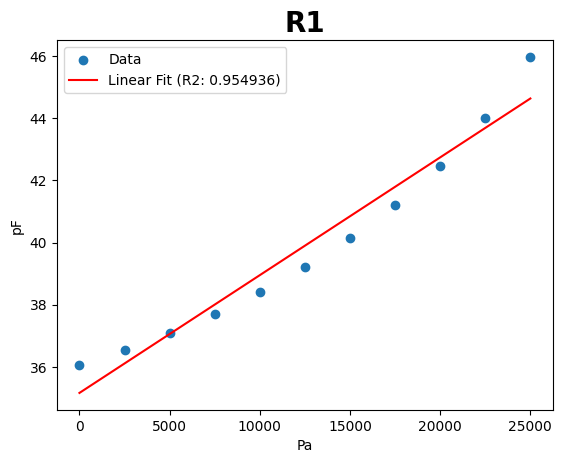

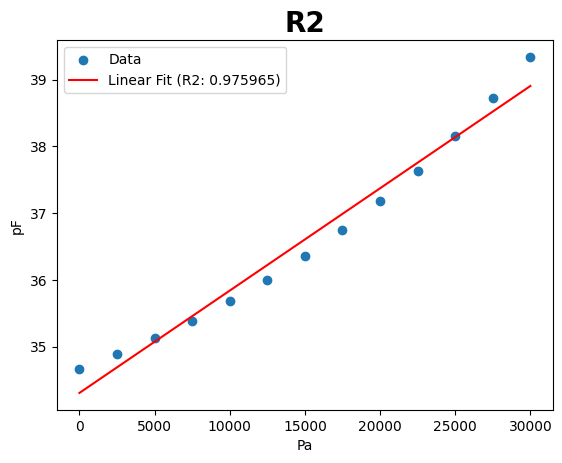

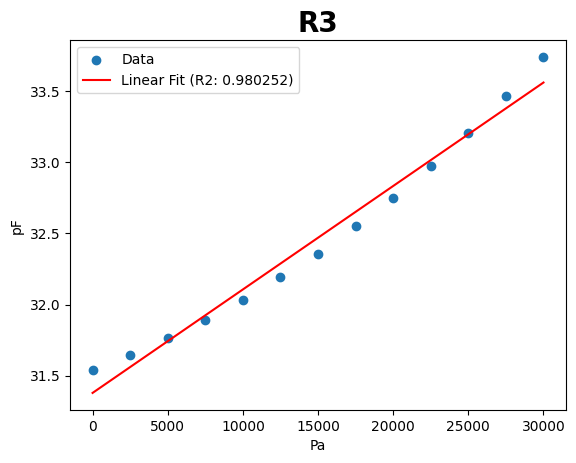

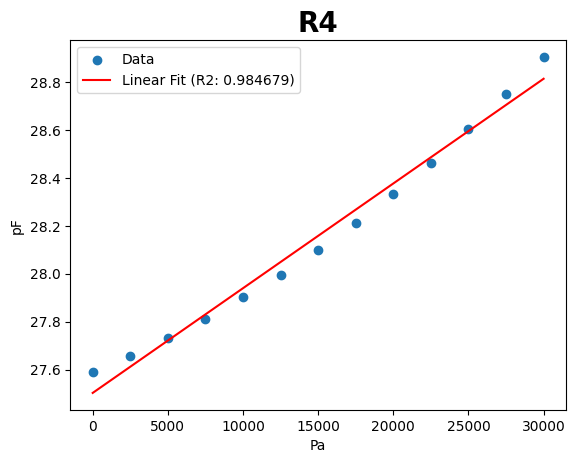

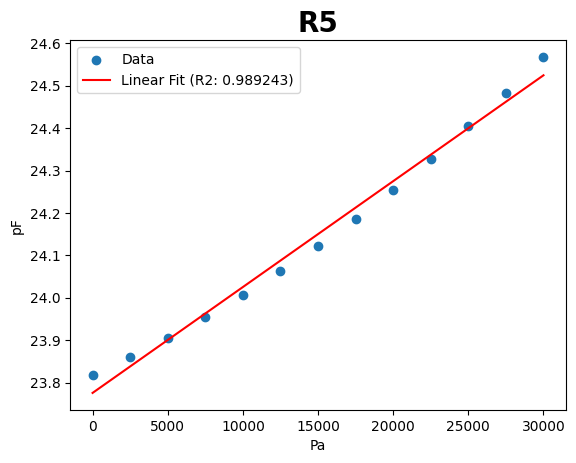

...

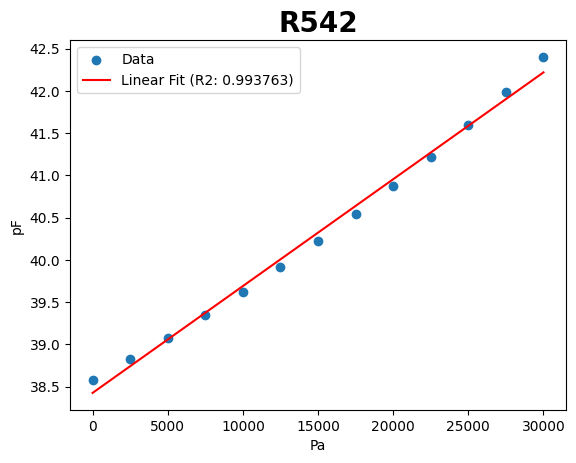

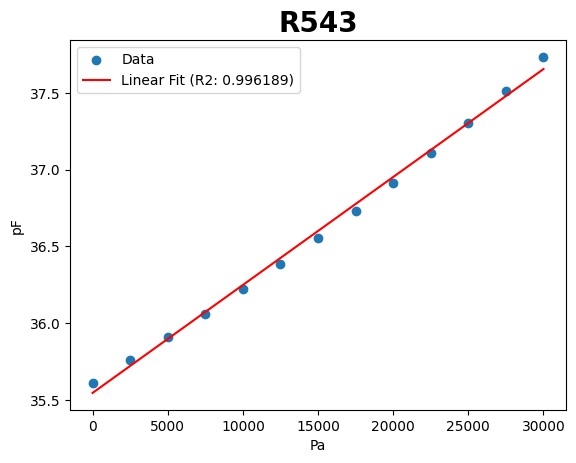

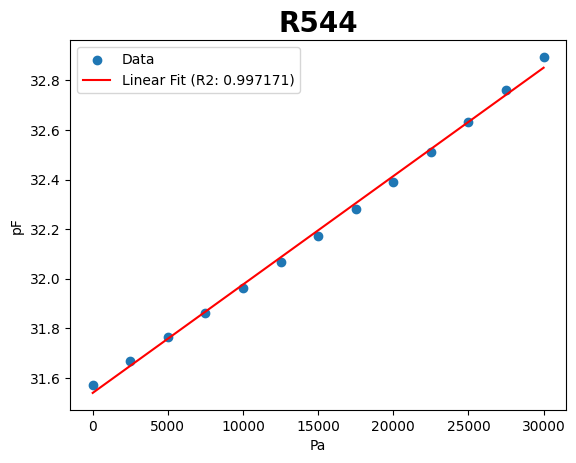

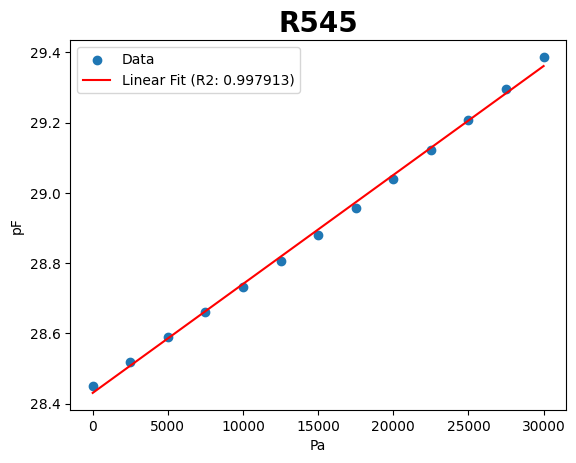

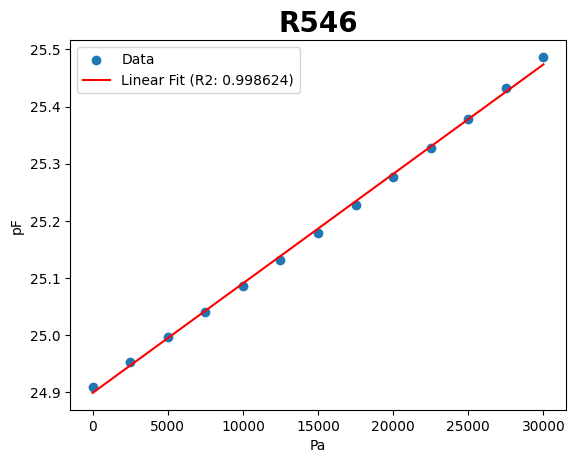

Skipping column 'R547' due to overdesign model.
Skipping column 'R548' due to overdesign model.
Skipping column 'R549' due to overdesign model.
Skipping column 'R550' due to overdesign model.
Skipping column 'R551' due to overdesign model.
Skipping column 'R552' due to overdesign model.
Skipping column 'R553' due to overdesign model.
Skipping column 'R554' due to overdesign model.
Skipping column 'R555' due to overdesign model.
Skipping column 'R556' due to overdesign model.
Skipping column 'R557' due to overdesign model.
Skipping column 'R558' due to overdesign model.
Skipping column 'R559' due to overdesign model.
Skipping column 'R560' due to overdesign model.
Skipping column 'R561' due to overdesign model.
Skipping column 'R562' due to overdesign model.
Skipping column 'R563' due to overdesign model.
Skipping column 'R564' due to overdesign model.
Skipping column 'R565' due to overdesign model.
Skipping column 'R566' due to overdesign model.
Skipping column 'R567' due to overdesign

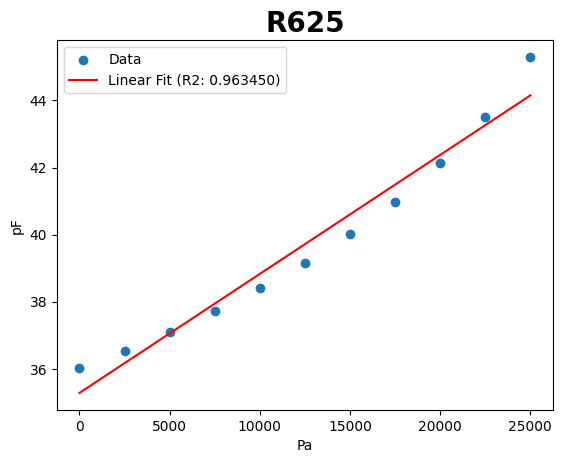

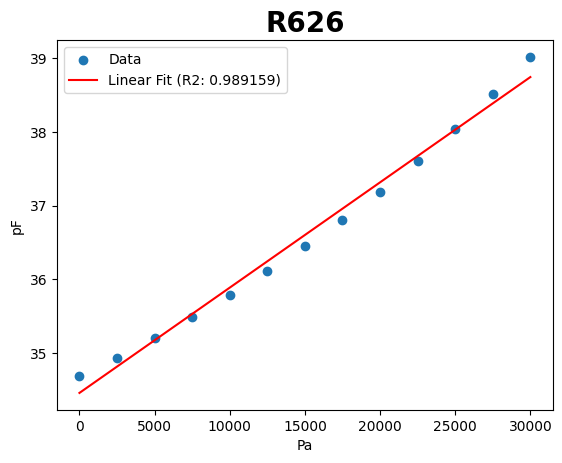

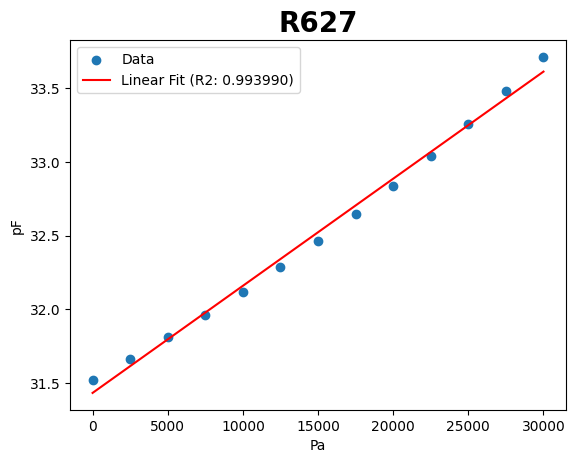

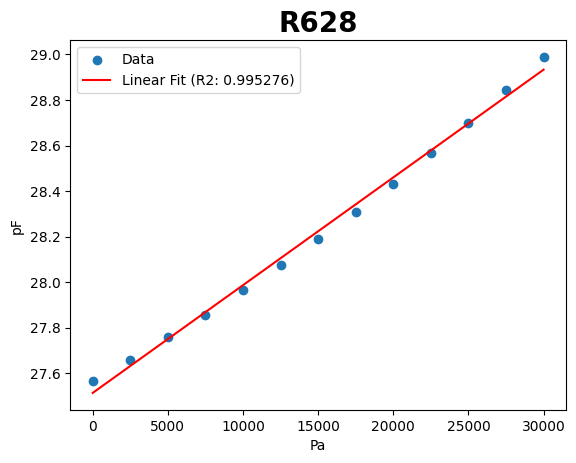

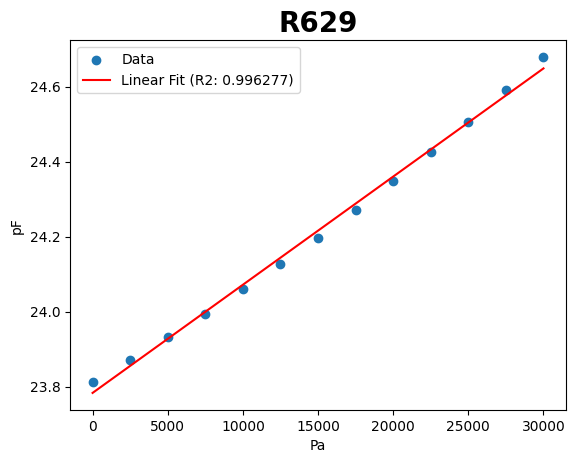

...

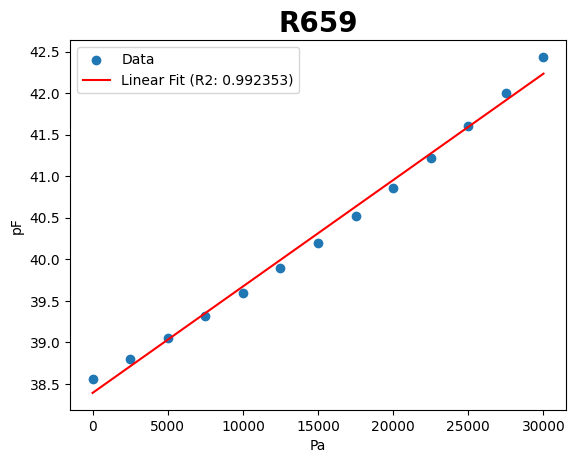

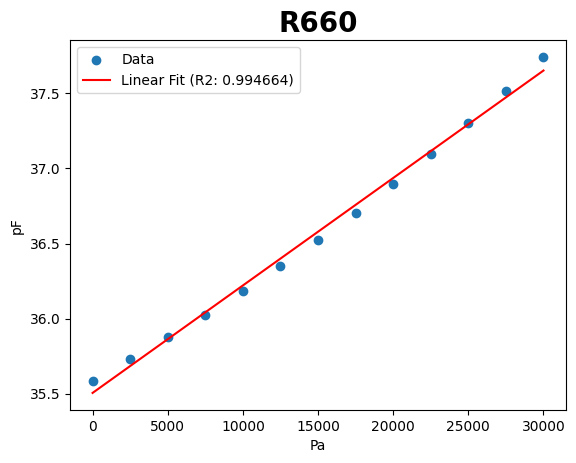

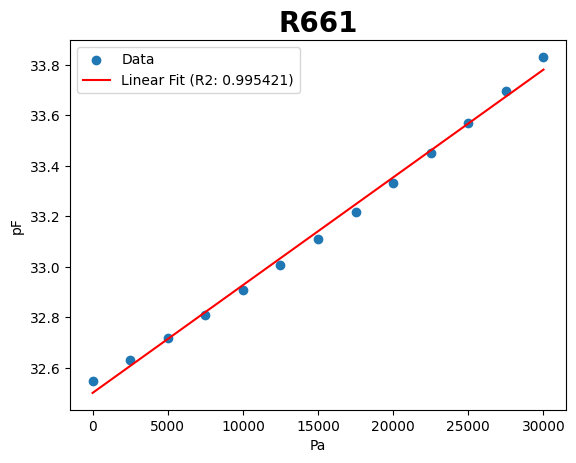

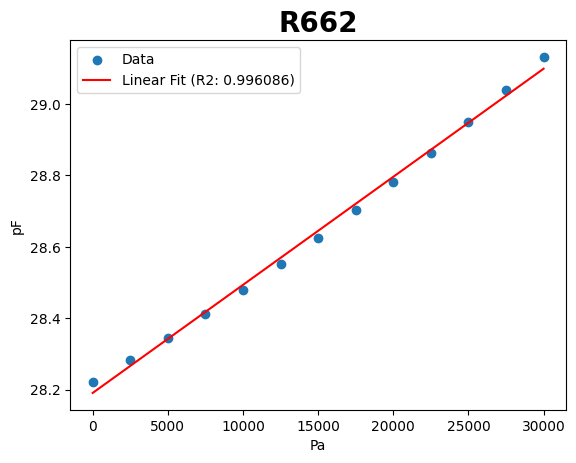

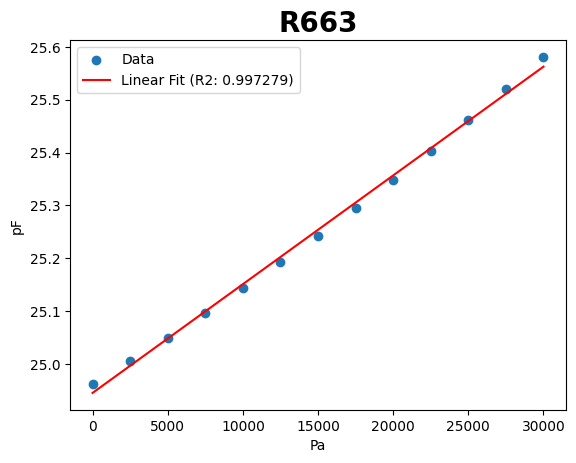

In [5]:
for column in r_columns:
    temp_data = data.dropna(subset=[column]).copy()
    temp_data = temp_data[pd.to_numeric(temp_data['Features'], errors='coerce').notna()]
    x_values = temp_data['Features'].astype(float)
    y_values = temp_data[column]

    if len(x_values) > 1:
        x_values_reshaped = x_values.values.reshape(-1, 1)

        model = LinearRegression()
        model.fit(x_values_reshaped, y_values)
        y_predicted = model.predict(x_values_reshaped)

        r2 = r2_score(y_values, y_predicted)

        plt.figure()
        plt.scatter(x_values, y_values, label='Data')
        plt.plot(x_values, y_predicted, color='red', label=f'Linear Fit (R2: {r2:.6f})')
        plt.xlabel('Pa')
        plt.ylabel('pF')
        plt.title(f'{column}', fontsize=20, fontweight='bold')
        plt.legend()
        plt.show()
    else:
        print(f"Skipping column '{column}' due to overdesign model.")

In [6]:
r2_summary = pd.DataFrame(columns=['Column', 'R2 Score'])

for column in r_columns:
    temp_data = pre_data.dropna(subset=[column]).copy()
    temp_data = temp_data[pd.to_numeric(temp_data['Features'], errors='coerce').notna()]

    if not temp_data.empty:
        x_values = temp_data['Features'].astype(float)
        y_values = temp_data[column]

        x_values_reshaped = x_values.values.reshape(-1, 1)

        model = LinearRegression()
        model.fit(x_values_reshaped, y_values)
        y_predicted = model.predict(x_values_reshaped)

        r2 = r2_score(y_values, y_predicted)
        r2_summary = pd.concat([r2_summary, pd.DataFrame({'Column': [column], 'R2 Score': [r2]})], ignore_index=True)
    else:
        r2_summary = pd.concat([r2_summary, pd.DataFrame({'Column': [column], 'R2 Score': ['Skipped (No valid data)']})], ignore_index=True)

display(r2_summary)

/tmp/ipython-input-6-1930806078.py:18: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  r2_summary = pd.concat([r2_summary, pd.DataFrame({'Column': [column], 'R2 Score': [r2]})], ignore_index=True)


,Column,R2 Score
0,R1,0.957237
1,R2,0.976661
2,R3,0.980665
3,R4,0.984873
4,R5,0.989419
...,...,...
658,R659,0.992692
659,R660,0.99486
660,R661,0.995604
661,R662,0.996226


In [7]:
pre_data = pd.read_excel("temp_excel_file.xlsx")

r2_summary_transposed = r2_summary.set_index('Column').T
r2_summary_transposed = r2_summary_transposed.reset_index().rename(columns={'index': 'Features'})

combined_data = pd.concat([pre_data, r2_summary_transposed], ignore_index=True)
combined_data.to_excel("combined_data_with_r2.xlsx", index=False)

print("Combined data with R2 scores saved to 'combined_data_with_r2.xlsx'")

Combined data with R2 scores saved to 'combined_data_with_r2.xlsx'


#ML for final DoE

In [8]:
feature_data = pre_data.iloc[:5]
feature_data_transposed = feature_data.set_index('Features').T.reset_index().rename(columns={'index': 'Column'})
display(feature_data_transposed)

Features,Column,Base_lenght,Base_angle,Contact_lenght,Point_x,Point_y
0,R1,4.0,60.0,1.0,3.8,3.2
1,R2,5.0,60.0,1.0,3.8,3.2
2,R3,6.0,60.0,1.0,3.8,3.2
3,R4,7.0,60.0,1.0,3.8,3.2
4,R5,8.0,60.0,1.0,3.8,3.2
...,...,...,...,...,...,...
658,R659,4.0,80.0,5.0,4.2,3.4
659,R660,5.0,80.0,5.0,4.2,3.4
660,R661,6.0,80.0,5.0,4.2,3.4
661,R662,7.0,80.0,5.0,4.2,3.4


In [9]:
combined_analysis_data = pd.merge(feature_data_transposed, r2_summary, on='Column')
display(combined_analysis_data)

,Column,Base_lenght,Base_angle,Contact_lenght,Point_x,Point_y,R2 Score
0,R1,4.0,60.0,1.0,3.8,3.2,0.957237
1,R2,5.0,60.0,1.0,3.8,3.2,0.976661
2,R3,6.0,60.0,1.0,3.8,3.2,0.980665
3,R4,7.0,60.0,1.0,3.8,3.2,0.984873
4,R5,8.0,60.0,1.0,3.8,3.2,0.989419
...,...,...,...,...,...,...,...
658,R659,4.0,80.0,5.0,4.2,3.4,0.992692
659,R660,5.0,80.0,5.0,4.2,3.4,0.99486
660,R661,6.0,80.0,5.0,4.2,3.4,0.995604
661,R662,7.0,80.0,5.0,4.2,3.4,0.996226


In [18]:
import numpy as np
from sklearn.linear_model import LinearRegression

feature_columns = ['Base_lenght', 'Base_angle', 'Contact_lenght', 'Point_x', 'Point_y']
combined_analysis_data['R2 Score'] = pd.to_numeric(combined_analysis_data['R2 Score'], errors='coerce')
cleaned_analysis_data = combined_analysis_data.dropna(subset=feature_columns + ['R2 Score']).copy()

X = cleaned_analysis_data[feature_columns]
y = cleaned_analysis_data['R2 Score']

model = LinearRegression()
model.fit(X, y)

feature_ranges = {}
for col in feature_columns:
    min_val = cleaned_analysis_data[col].min()
    max_val = cleaned_analysis_data[col].max()
    feature_ranges[col] = np.linspace(min_val, max_val, 10)

from itertools import product
all_combinations = list(product(*feature_ranges.values()))
all_combinations_df = pd.DataFrame(all_combinations, columns=feature_columns)

predicted_r2_scores = model.predict(all_combinations_df)
predicted_r2_scores = np.clip(predicted_r2_scores, None, 1.0)

best_combination_index = np.argmax(predicted_r2_scores)
best_combination = all_combinations_df.iloc[best_combination_index]
highest_predicted_r2 = predicted_r2_scores[best_combination_index]

print("Optimal feature values to maximize R2 Score:")
print(best_combination)
print(f"\nHighest predicted R2 Score: {highest_predicted_r2:.6f}")

Optimal feature values to maximize R2 Score:
Base_lenght        5.333333
Base_angle        76.111111
Contact_lenght     5.000000
Point_x            3.200000
Point_y            3.133333
Name: 58903, dtype: float64

Highest predicted R2 Score: 1.000000


In [17]:
import numpy as np
from sklearn.linear_model import LinearRegression

feature_columns = ['Base_lenght', 'Base_angle', 'Contact_lenght', 'Point_x', 'Point_y']

# Convert 'R2 Score' to numeric, coercing errors to NaN
combined_analysis_data['R2 Score'] = pd.to_numeric(combined_analysis_data['R2 Score'], errors='coerce')

# Drop rows with NaN in features or R2 Score
cleaned_analysis_data = combined_analysis_data.dropna(subset=feature_columns + ['R2 Score']).copy()

X = cleaned_analysis_data[feature_columns]
y = cleaned_analysis_data['R2 Score']

model = LinearRegression()
model.fit(X, y)

feature_ranges = {}
for col in feature_columns:
    min_val = cleaned_analysis_data[col].min()
    max_val = cleaned_analysis_data[col].max()
    # Constrain Point_x to be at least 3.5 based on user feedback
    if col == 'Point_x':
        min_val = max(min_val, 3.5)
    feature_ranges[col] = np.linspace(min_val, max_val, 10)


from itertools import product
all_combinations = list(product(*feature_ranges.values()))
all_combinations_df = pd.DataFrame(all_combinations, columns=feature_columns)

predicted_r2_scores = model.predict(all_combinations_df)
predicted_r2_scores = np.clip(predicted_r2_scores, None, 1.0)


best_combination_index = np.argmax(predicted_r2_scores)
best_combination = all_combinations_df.iloc[best_combination_index]
highest_predicted_r2 = predicted_r2_scores[best_combination_index]

print("Optimal feature values to maximize R2 Score:")
print(best_combination)
print(f"\nHighest predicted R2 Score: {highest_predicted_r2:.6f}")

Optimal feature values to maximize R2 Score:
Base_lenght        6.000000
Base_angle        76.111111
Contact_lenght     4.555556
Point_x            3.500000
Point_y            3.400000
Name: 68809, dtype: float64

Highest predicted R2 Score: 1.000000
